In [1]:
!cp -r "/kaggle/input/lane-segmentation-data/data" /kaggle/working/

# Cài đặt & import thư viện

In [2]:
!pip install -q segmentation-models-pytorch albumentations

import os
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image
from tqdm import tqdm


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 68.7 MB/s eta 0:00:00:00:0100:01


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


# Cấu hình cơ bản

In [3]:
# Cấu hình
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
num_classes = 5  # 1, 2, 3, 4 (background)
image_size = (384, 512)  # H, W


# Dataset class

In [4]:
class SegDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = np.array(Image.open(self.image_paths[idx]).convert("RGB"))
        mask = np.array(Image.open(self.mask_paths[idx]))  # uint8, shape: HxW

        if self.transform:
            aug = self.transform(image=img, mask=mask)
            img = aug['image']
            mask = aug['mask']

        return img, mask.long()


# Load dữ liệu 

In [5]:
from glob import glob
import os

# Thư mục đã chia
base_dir = '/kaggle/working/data'

# Load ảnh theo thư mục
train_imgs = sorted(glob(os.path.join(base_dir, 'train/images/*.jpg')))
train_masks = sorted(glob(os.path.join(base_dir, 'train/masks/*.png')))

val_imgs = sorted(glob(os.path.join(base_dir, 'val/images/*.jpg')))
val_masks = sorted(glob(os.path.join(base_dir, 'val/masks/*.png')))

test_imgs = sorted(glob(os.path.join(base_dir, 'test/images/*.jpg')))
test_masks = sorted(glob(os.path.join(base_dir, 'test/masks/*.png')))


# Augmentation

In [12]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_tf = A.Compose([
    # Hình học
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.2),  # thêm flip dọc nếu ngữ cảnh cho phép
    A.RandomRotate90(p=0.2),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.15, rotate_limit=15, border_mode=0, p=0.5),
    A.ElasticTransform(alpha=1, sigma=50, alpha_affine=20, border_mode=0, p=0.2),  # biến dạng hình học mềm mại
    A.GridDistortion(num_steps=5, distort_limit=0.3, border_mode=0, p=0.2),  # lưới méo hình
    
    # Màu sắc & ánh sáng
    A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.5),
    A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=20, val_shift_limit=10, p=0.4),
    A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.2),
    A.RandomGamma(p=0.3),
    A.CLAHE(p=0.2),

    # Noise & blur
    A.MotionBlur(blur_limit=5, p=0.2),
    A.MedianBlur(blur_limit=3, p=0.1),
    A.GaussNoise(var_limit=(10, 60), p=0.3),

    # Cutout để tăng tính đa dạng
    A.CoarseDropout(max_holes=8, max_height=32, max_width=32, fill_value=0, mask_fill_value=0, p=0.3),

    # Normalize & Tensor
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

# Transform cho ảnh val/test
val_tf = A.Compose([
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])


/tmp/ipykernel_35/810524424.py:11: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10, 50), p=0.3),


# Tạo DataLoader

In [13]:
batch_size = 8

train_dataset = SegDataset(train_imgs, train_masks, transform=train_tf)
val_dataset = SegDataset(val_imgs, val_masks, transform=val_tf)
test_dataset = SegDataset(test_imgs, test_masks, transform=val_tf)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

#  Tạo mô hình DeepLabV3+ + MobileNetV3

In [14]:
model = smp.DeepLabV3Plus(
    encoder_name='mobilenet_v2',
    encoder_weights='imagenet',
    in_channels=3,
    classes=num_classes
).to(device)


# Loss, optimizer & metrics

In [15]:
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
import torch

def calc_metrics(preds, masks, num_classes):
    """
    preds: Tensor (B, C, H, W) - output logits hoặc softmax (chưa argmax)
    masks: Tensor (B, H, W) - ground truth integer class labels
    num_classes: int
    """

    # Chọn class dự đoán (B, H, W)
    preds = torch.argmax(preds, dim=1)

    ious = []
    dices = []
    pixel_accs = []

    for cls in range(num_classes):
        pred_inds = (preds == cls)
        target_inds = (masks == cls)

        intersection = (pred_inds & target_inds).sum().item()
        union = (pred_inds | target_inds).sum().item()
        pred_sum = pred_inds.sum().item()
        target_sum = target_inds.sum().item()

        if union == 0:
            iou = float('nan')  # không có pixel lớp này trong batch
        else:
            iou = intersection / union

        if pred_sum + target_sum == 0:
            dice = float('nan')
        else:
            dice = 2 * intersection / (pred_sum + target_sum)

        total_pixels = masks.numel()
        correct_pixels = (preds == masks).sum().item()
        pixel_acc = correct_pixels / total_pixels

        ious.append(iou)
        dices.append(dice)
        pixel_accs.append(pixel_acc)  # pixel acc chung cho cả batch

    mean_iou = torch.tensor([iou for iou in ious if not torch.isnan(torch.tensor(iou))]).mean().item()
    mean_dice = torch.tensor([dice for dice in dices if not torch.isnan(torch.tensor(dice))]).mean().item()
    mean_pixel_acc = sum(pixel_accs) / len(pixel_accs)

    return mean_iou, mean_dice, mean_pixel_acc


# Define Huấn luyện

In [16]:
def train_one_epoch(model, loader, optimizer, loss_fn, device, num_classes):
    model.train()
    total_loss = 0
    total_iou = 0
    total_dice = 0
    total_pixel_acc = 0
    count = 0

    for imgs, masks in tqdm(loader):
        imgs, masks = imgs.to(device), masks.to(device)

        preds = model(imgs)
        loss = loss_fn(preds, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        mean_iou, mean_dice, mean_pixel_acc = calc_metrics(preds, masks, num_classes)

        total_loss += loss.item()
        total_iou += mean_iou
        total_dice += mean_dice
        total_pixel_acc += mean_pixel_acc
        count += 1

    avg_loss = total_loss / count
    avg_iou = total_iou / count
    avg_dice = total_dice / count
    avg_pixel_acc = total_pixel_acc / count

    return avg_loss, avg_iou, avg_dice, avg_pixel_acc
    
def validate(model, loader, loss_fn, device, num_classes):
    model.eval()
    total_loss = 0
    total_iou = 0
    total_dice = 0
    total_pixel_acc = 0
    count = 0

    with torch.no_grad():
        for imgs, masks in tqdm(loader):
            imgs, masks = imgs.to(device), masks.to(device)

            preds = model(imgs)
            loss = loss_fn(preds, masks)

            mean_iou, mean_dice, mean_pixel_acc = calc_metrics(preds, masks, num_classes)

            total_loss += loss.item()
            total_iou += mean_iou
            total_dice += mean_dice
            total_pixel_acc += mean_pixel_acc
            count += 1

    avg_loss = total_loss / count
    avg_iou = total_iou / count
    avg_dice = total_dice / count
    avg_pixel_acc = total_pixel_acc / count

    return avg_loss, avg_iou, avg_dice, avg_pixel_acc


# Huấn luyện

In [17]:
import time
import matplotlib.pyplot as plt
best_loss = float('inf')
epochs = 50
log_path = '/kaggle/working/deeplabv3plus_best.pth'

train_losses, val_losses = [], []
train_ious, val_ious = [], []

log_file = open('/kaggle/working/train_log.txt', 'w')

with open(log_path, 'w') as log_file:
    log_file.write('epoch,train_loss,train_iou,train_dice,train_pixel_acc,val_loss,val_iou,val_dice,val_pixel_acc\n')

for epoch in range(1, num_epochs + 1):
    start_time = time.time()

    train_loss, train_iou, train_dice, train_pixel_acc = train_one_epoch(
        model, train_loader, optimizer, loss_fn, device, num_classes
    )

    val_loss, val_iou, val_dice, val_pixel_acc = validate(
        model, val_loader, loss_fn, device, num_classes
    )

    elapsed = time.time() - start_time

    log_line = f"{epoch},{train_loss:.4f},{train_iou:.4f},{train_dice:.4f},{train_pixel_acc:.4f}," \
               f"{val_loss:.4f},{val_iou:.4f},{val_dice:.4f},{val_pixel_acc:.4f}\n"

    print(f"Epoch {epoch} | Time {elapsed:.1f}s")
    print(f"Train Loss: {train_loss:.4f} | IoU: {train_iou:.4f} | Dice: {train_dice:.4f} | Pixel Acc: {train_pixel_acc:.4f}")
    print(f"Val   Loss: {val_loss:.4f} | IoU: {val_iou:.4f} | Dice: {val_dice:.4f} | Pixel Acc: {val_pixel_acc:.4f}")

    with open(log_path, 'a') as log_file:
        log_file.write(log_line)


100%|██████████| 438/438 [01:46<00:00,  4.12it/s]


Epoch 1: Train Loss=0.3098, Val Loss=0.2387, Train IoU=0.4868, Val IoU=0.3935, Time=114.2s
✅ Saved best model


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 2: Train Loss=0.2526, Val Loss=0.2235, Train IoU=0.5320, Val IoU=0.4001, Time=116.1s
✅ Saved best model


100%|██████████| 438/438 [01:48<00:00,  4.04it/s]


Epoch 3: Train Loss=0.2386, Val Loss=0.2091, Train IoU=0.5478, Val IoU=0.4216, Time=116.2s
✅ Saved best model


100%|██████████| 438/438 [01:48<00:00,  4.04it/s]


Epoch 4: Train Loss=0.2262, Val Loss=0.2119, Train IoU=0.5626, Val IoU=0.4156, Time=116.2s


100%|██████████| 438/438 [01:48<00:00,  4.04it/s]


Epoch 5: Train Loss=0.2234, Val Loss=0.2048, Train IoU=0.5653, Val IoU=0.4572, Time=116.0s
✅ Saved best model


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 6: Train Loss=0.2155, Val Loss=0.2107, Train IoU=0.5765, Val IoU=0.4050, Time=116.2s


100%|██████████| 438/438 [01:48<00:00,  4.04it/s]


Epoch 7: Train Loss=0.2153, Val Loss=0.2011, Train IoU=0.5786, Val IoU=0.4084, Time=116.2s
✅ Saved best model


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 8: Train Loss=0.2071, Val Loss=0.1971, Train IoU=0.5863, Val IoU=0.4779, Time=115.8s
✅ Saved best model


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 9: Train Loss=0.2068, Val Loss=0.1866, Train IoU=0.5934, Val IoU=0.4481, Time=116.1s
✅ Saved best model


100%|██████████| 438/438 [01:48<00:00,  4.04it/s]


Epoch 10: Train Loss=0.2045, Val Loss=0.1869, Train IoU=0.6009, Val IoU=0.4722, Time=116.2s


100%|██████████| 438/438 [01:48<00:00,  4.04it/s]


Epoch 11: Train Loss=0.1950, Val Loss=0.1811, Train IoU=0.6151, Val IoU=0.4874, Time=116.1s
✅ Saved best model


100%|██████████| 438/438 [01:48<00:00,  4.04it/s]


Epoch 12: Train Loss=0.1942, Val Loss=0.1844, Train IoU=0.6180, Val IoU=0.4547, Time=116.2s


100%|██████████| 438/438 [01:48<00:00,  4.04it/s]


Epoch 13: Train Loss=0.1908, Val Loss=0.1854, Train IoU=0.6219, Val IoU=0.5052, Time=116.2s


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 14: Train Loss=0.1881, Val Loss=0.1843, Train IoU=0.6280, Val IoU=0.4845, Time=116.0s


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 15: Train Loss=0.1862, Val Loss=0.1785, Train IoU=0.6304, Val IoU=0.5089, Time=116.0s
✅ Saved best model


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 16: Train Loss=0.1851, Val Loss=0.2044, Train IoU=0.6345, Val IoU=0.4444, Time=116.0s


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 17: Train Loss=0.1818, Val Loss=0.1794, Train IoU=0.6351, Val IoU=0.5394, Time=115.9s


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 18: Train Loss=0.1780, Val Loss=0.1737, Train IoU=0.6438, Val IoU=0.5032, Time=115.9s
✅ Saved best model


100%|██████████| 438/438 [01:48<00:00,  4.04it/s]


Epoch 19: Train Loss=0.1790, Val Loss=0.1763, Train IoU=0.6454, Val IoU=0.5028, Time=116.2s


100%|██████████| 438/438 [01:48<00:00,  4.04it/s]


Epoch 20: Train Loss=0.1763, Val Loss=0.1698, Train IoU=0.6460, Val IoU=0.5026, Time=116.0s
✅ Saved best model


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 21: Train Loss=0.1753, Val Loss=0.1675, Train IoU=0.6481, Val IoU=0.5506, Time=116.0s
✅ Saved best model


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 22: Train Loss=0.1744, Val Loss=0.1736, Train IoU=0.6518, Val IoU=0.5224, Time=116.1s


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 23: Train Loss=0.1707, Val Loss=0.1705, Train IoU=0.6588, Val IoU=0.5090, Time=115.8s


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 24: Train Loss=0.1703, Val Loss=0.1737, Train IoU=0.6570, Val IoU=0.4947, Time=116.0s


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 25: Train Loss=0.1684, Val Loss=0.1702, Train IoU=0.6599, Val IoU=0.5251, Time=116.0s


100%|██████████| 438/438 [01:47<00:00,  4.06it/s]


Epoch 26: Train Loss=0.1663, Val Loss=0.1680, Train IoU=0.6639, Val IoU=0.5428, Time=115.9s


100%|██████████| 438/438 [01:48<00:00,  4.05it/s]


Epoch 27: Train Loss=0.1651, Val Loss=0.1753, Train IoU=0.6639, Val IoU=0.5167, Time=115.9s


100%|██████████| 438/438 [01:47<00:00,  4.06it/s]


Epoch 28: Train Loss=0.1642, Val Loss=0.1812, Train IoU=0.6648, Val IoU=0.5365, Time=115.7s


100%|██████████| 438/438 [01:47<00:00,  4.06it/s]


Epoch 29: Train Loss=0.1656, Val Loss=0.1714, Train IoU=0.6612, Val IoU=0.5215, Time=115.8s


100%|██████████| 438/438 [01:47<00:00,  4.07it/s]


Epoch 30: Train Loss=0.1606, Val Loss=0.1668, Train IoU=0.6698, Val IoU=0.5258, Time=115.6s
✅ Saved best model


# Inference kiểm tra

In [ ]:
def test_model(model, test_loader, loss_fn, device, num_classes, log_path=None):
    test_loss, test_iou, test_dice, test_pixel_acc = validate(model, test_loader, loss_fn, device, num_classes)

    print(f"Test Loss: {test_loss:.4f} | IoU: {test_iou:.4f} | Dice: {test_dice:.4f} | Pixel Acc: {test_pixel_acc:.4f}")
    
    if log_path is not None:
        with open(log_path, 'w') as log_file:
            log_file.write(f"test,{test_loss:.4f},{test_iou:.4f},{test_dice:.4f},{test_pixel_acc:.4f}\n")

    return test_loss, test_iou, test_dice, test_pixel_acc
    
model.load_state_dict(torch.load(save_path))
model.eval()

test_log_path = '/kaggle/working/test_log.txt' 
test_model(model, test_loader, loss_fn, device, num_classes, log_path=test_log_path)


import matplotlib.pyplot as plt
import numpy as np
import torch

# Palette RGB cho từng class ID (0 là background)
palette = {
    0: [0, 0, 0],             # background - đen
    1: [140, 140, 200],       # Crosswalk - Plain / Lane Marking - Crosswalk
    2: [128, 64, 128],        # Road / Bike Lane
    3: [96, 96, 96],          # Pedestrian Area / Sidewalk
    4: [244, 35, 232],        # Một lớp khác nếu cần
}

def mask_to_rgb(mask):
    # mask là numpy array 2D (H, W) integer labels
    h, w = mask.shape
    rgb = np.zeros((h, w, 3), dtype=np.uint8)
    for cls_id, color in palette.items():
        rgb[mask == cls_id] = color
    return rgb

def show_sample_image_mask(dataset, idx=0):
    image, mask = dataset[idx]

    if torch.is_tensor(image):
        image = image.permute(1, 2, 0).cpu().numpy()
    if torch.is_tensor(mask):
        mask = mask.cpu().numpy()

    mask_rgb = mask_to_rgb(mask)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title("Input Image")
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Mask with Color Palette")
    plt.imshow(mask_rgb)
    plt.axis('off')

    plt.show()

# Ví dụ
show_sample_image_mask(test_dataset, idx=0)


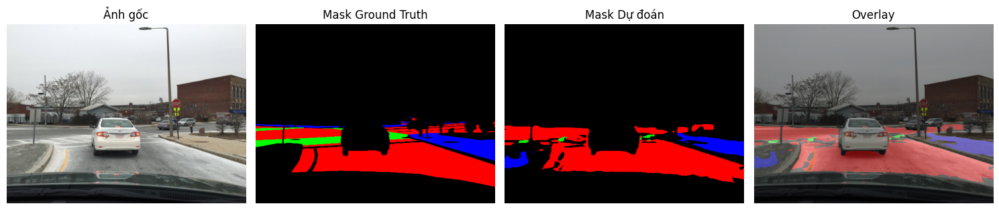

In [25]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Màu cho mỗi lớp (tùy dataset bạn có thể thay)
COLORS = [
    (255, 255, 0),     # lớp 0: vàng
    (0, 255, 0),       # lớp 1: xanh lá
    (255, 0, 0),       # lớp 2: đỏ
    (0, 0, 255),       # lớp 3: xanh dương
    (0, 0, 0),         # lớp 4: nền - đen
]

def decode_segmap(mask, num_classes):
    """Convert segmentation class mask to RGB image."""
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for cls in range(num_classes):
        color_mask[mask == cls] = COLORS[cls]
    return color_mask

def show_prediction(model, dataset, device, idx=0, num_classes=3):
    """
    Hiển thị ảnh gốc, mask thật, và mask dự đoán.
    - model: segmentation model
    - dataset: dataset test/val có trả về ảnh, mask
    - idx: index trong tập test
    """
    model.eval()

    with torch.no_grad():
        image, mask = dataset[idx]  # ảnh (tensor CHW), mask (H, W)

        # Đưa ảnh về batch và predict
        input_tensor = image.unsqueeze(0).to(device)
        output = model(input_tensor)  # (1, C, H, W)
        pred_mask = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()

        # Chuyển ảnh tensor về RGB
        image_np = image.permute(1, 2, 0).cpu().numpy()
        image_np = (image_np * np.array([0.229, 0.224, 0.225]) +
                    np.array([0.485, 0.456, 0.406]))  # Unnormalize
        image_np = np.clip(image_np * 255, 0, 255).astype(np.uint8)

        # Tạo mask màu
        pred_color = decode_segmap(pred_mask, num_classes)
        mask_color = decode_segmap(mask.numpy(), num_classes)

        # Overlay
        overlay = cv2.addWeighted(image_np, 0.6, pred_color, 0.4, 0)

        # Hiển thị
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 4, 1)
        plt.imshow(image_np)
        plt.title("Ảnh gốc")
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.imshow(mask_color)
        plt.title("Mask Ground Truth")
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.imshow(pred_color)
        plt.title("Mask Dự đoán")
        plt.axis('off')

        plt.subplot(1, 4, 4)
        plt.imshow(overlay)
        plt.title("Overlay")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

model.load_state_dict(torch.load(save_path))
model.eval()
show_prediction(model, test_dataset, device, idx=36, num_classes=num_classes)

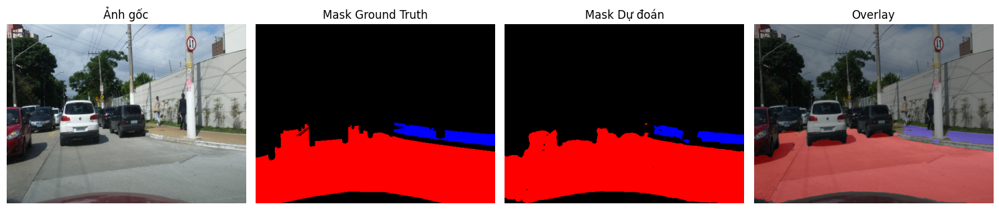

In [26]:
show_prediction(model, test_dataset, device, idx=3, num_classes=num_classes)

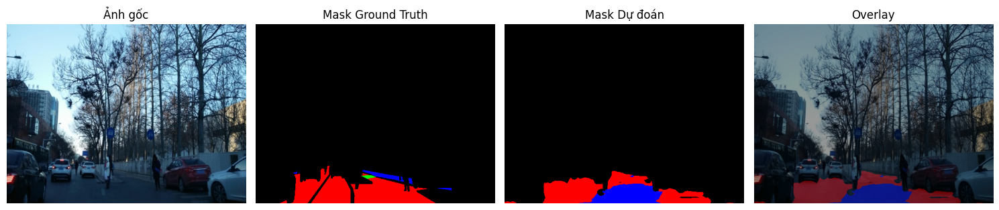

In [27]:
show_prediction(model, test_dataset, device, idx=5, num_classes=num_classes)

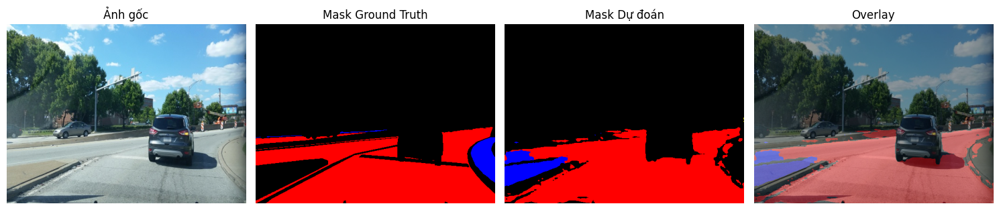

In [28]:
show_prediction(model, test_dataset, device, idx=10, num_classes=num_classes)

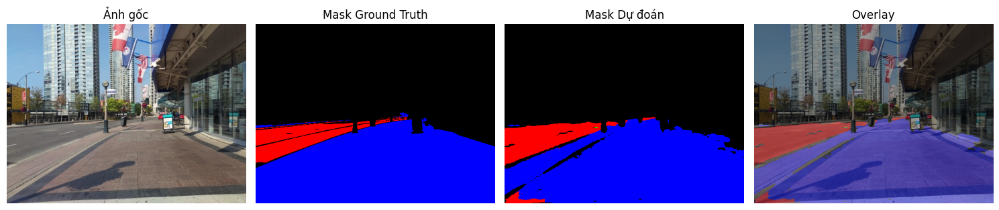

In [33]:
show_prediction(model, test_dataset, device, idx=35, num_classes=num_classes)

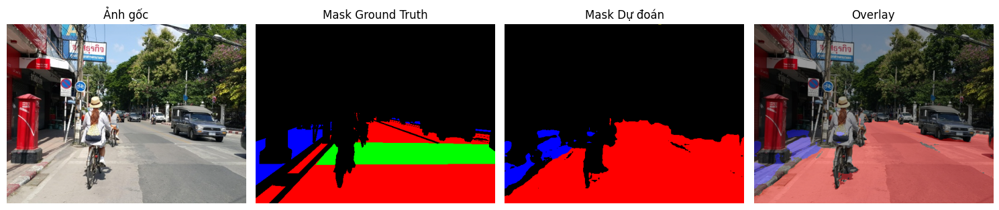

In [34]:
show_prediction(model, test_dataset, device, idx=29, num_classes=num_classes)

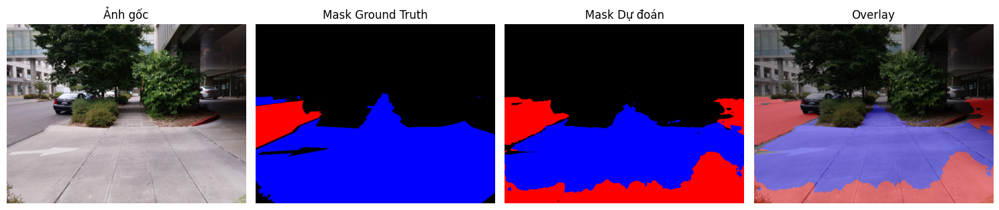

In [35]:
show_prediction(model, test_dataset, device, idx=47, num_classes=num_classes)

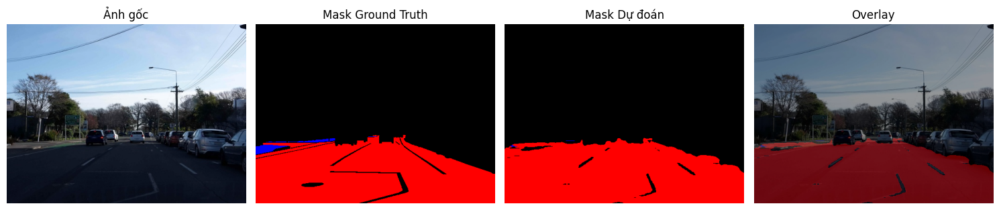

In [37]:
show_prediction(model, test_dataset, device, idx=33, num_classes=num_classes)

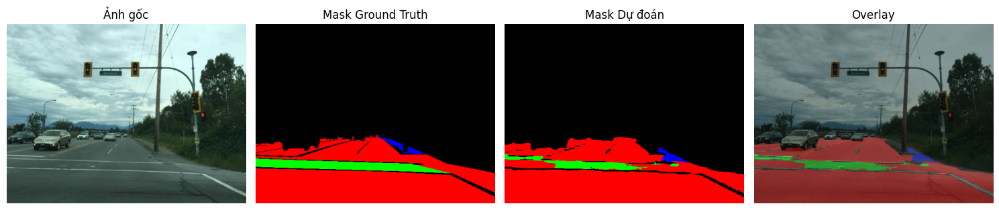

In [38]:
show_prediction(model, test_dataset, device, idx=41, num_classes=num_classes)

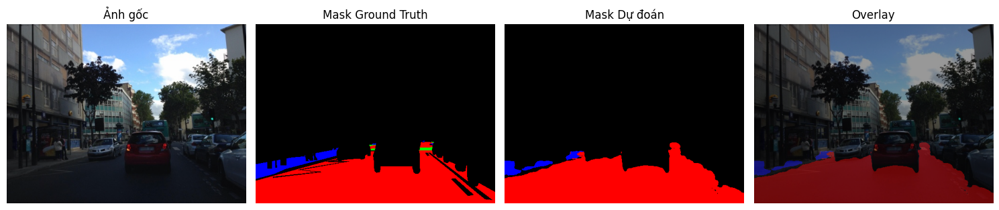

In [39]:
show_prediction(model, test_dataset, device, idx=15, num_classes=num_classes)

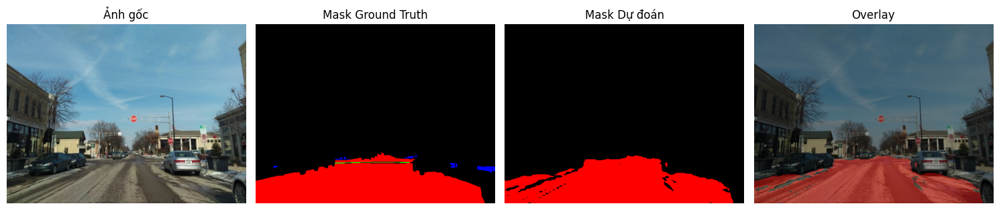

In [40]:
show_prediction(model, test_dataset, device, idx=6, num_classes=num_classes)

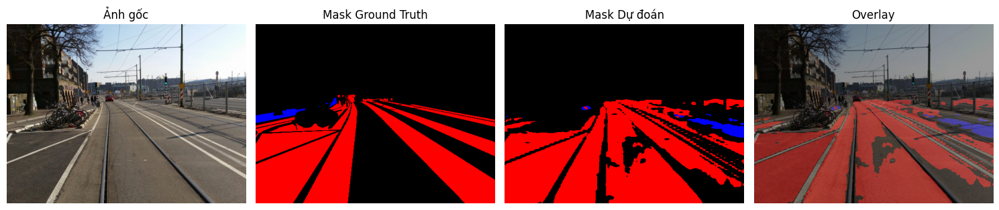

In [41]:
show_prediction(model, test_dataset, device, idx=9, num_classes=num_classes)

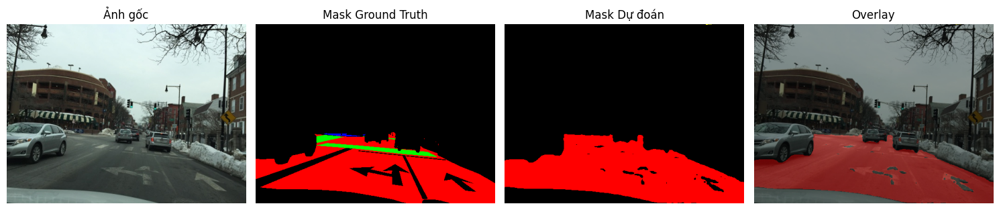

In [42]:
show_prediction(model, test_dataset, device, idx=27, num_classes=num_classes)

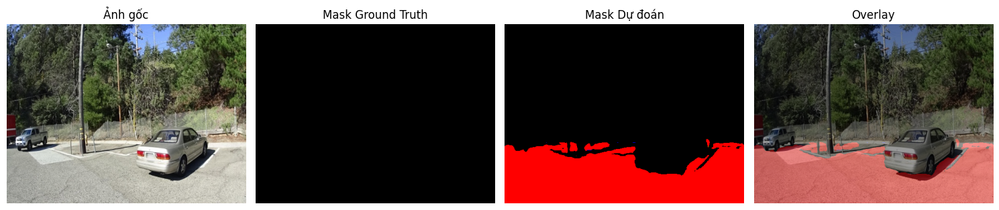

In [43]:
show_prediction(model, test_dataset, device, idx=48, num_classes=num_classes)

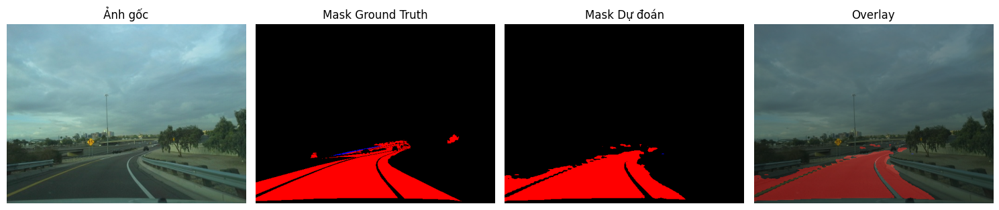

In [45]:
show_prediction(model, test_dataset, device, idx=52, num_classes=num_classes)

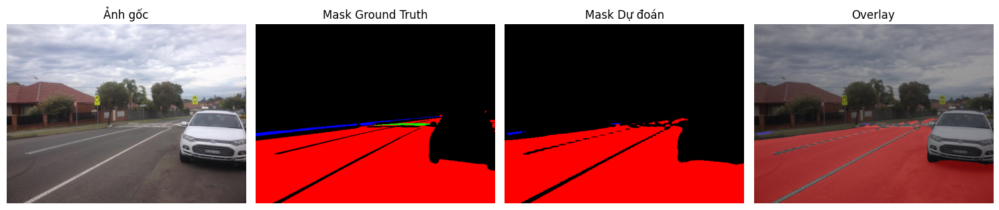

In [47]:
show_prediction(model, test_dataset, device, idx=210, num_classes=num_classes)

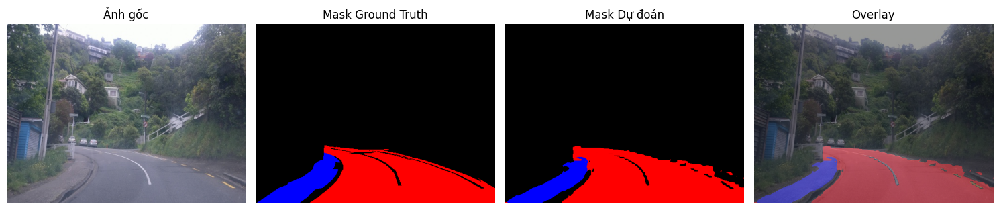

In [48]:
show_prediction(model, test_dataset, device, idx=276, num_classes=num_classes)

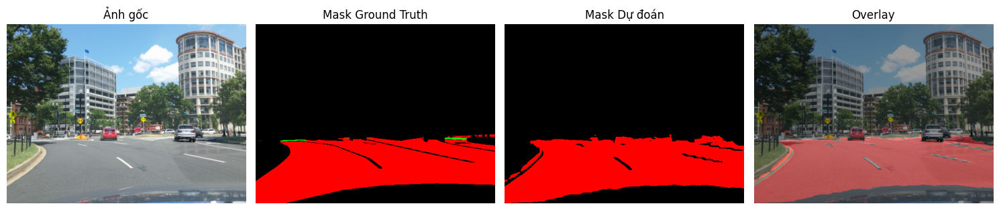

In [49]:
show_prediction(model, test_dataset, device, idx=216, num_classes=num_classes)

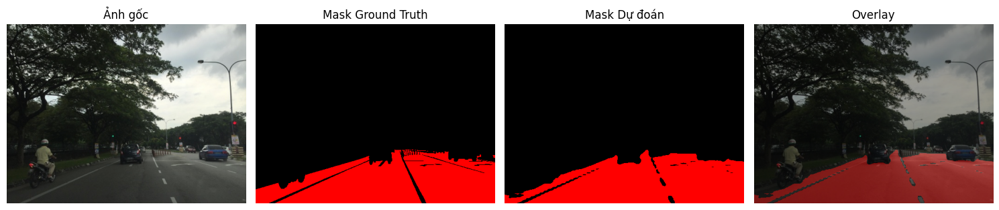

In [50]:
show_prediction(model, test_dataset, device, idx=323, num_classes=num_classes)

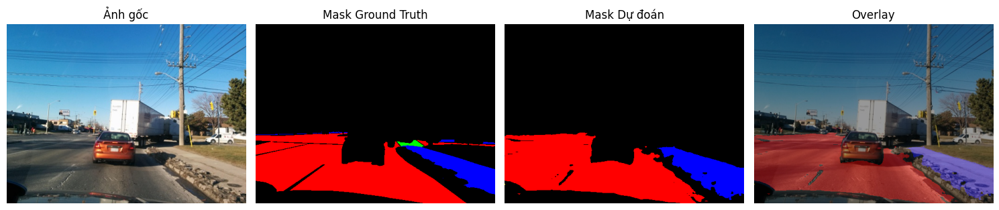

In [51]:
show_prediction(model, test_dataset, device, idx=317, num_classes=num_classes)

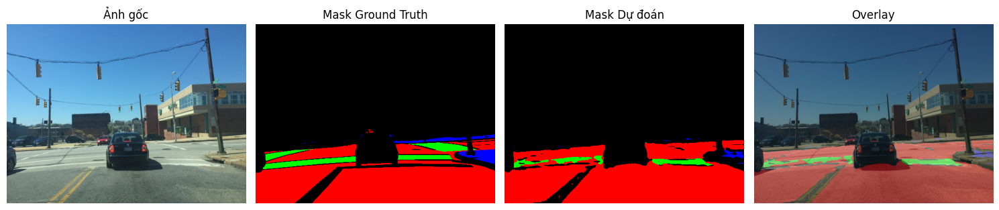

In [56]:
show_prediction(model, test_dataset, device, idx=298, num_classes=num_classes)

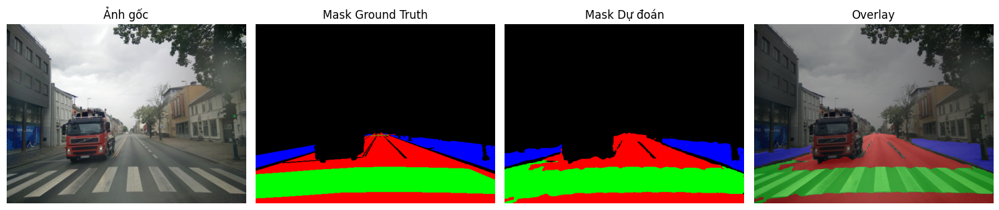

In [57]:
show_prediction(model, test_dataset, device, idx=278, num_classes=num_classes)

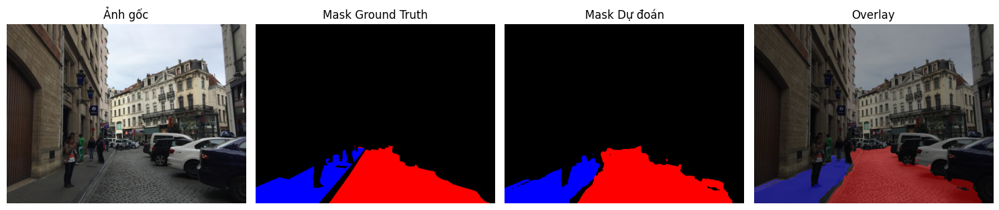

In [59]:
show_prediction(model, test_dataset, device, idx=263, num_classes=num_classes)